- trans_date_trans_time: The timestamp indicating when the transaction occurred.

- cc_num: Credit card number used for the transaction.

- merchant: The name or identifier of the merchant where the transaction took place.

- category: The category of the transaction (e.g., groceries, electronics, etc.).

- amt: The amount of money involved in the transaction.

- first: The first name of the cardholder.

- last: The last name of the cardholder.

- gender: Gender of the cardholder.

- street: The street address of the cardholder.

- city: The city where the cardholder resides.

- state: The state where the cardholder resides.

- zip: The ZIP code of the cardholder's location.

- lat: Latitude coordinate of the cardholder's location.

- long: Longitude coordinate of the cardholder's location.

- city_pop: The population of the city where the cardholder resides.

- job: The occupation or job title of the cardholder.

- dob: Date of birth of the cardholder.

- trans_num: Transaction number or identifier.

- unix_time: The transaction timestamp in UNIX time format.

- merch_lat: Latitude coordinate of the merchant's location.

- merch_long: Longitude coordinate of the merchant's location.

- is_fraud: Binary indicator (0 or 1) denoting whether the transaction is fraudulent (1) or not (0).

In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from datetime import timedelta
import sklearn
from datetime import datetime
import tensorflow as tf
from tensorflow import keras
from sklearn.metrics import confusion_matrix

2024-01-30 21:11:19.541622: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-30 21:11:19.681375: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2024-01-30 21:11:19.681408: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2024-01-30 21:11:19.722802: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-30 21:11:20.455452: W tensorflow/stream_executor/pla

In [ ]:


# Load the first dt, normal dataset na (df1)
#df1 = pd.read_csv()

# Load the second dataset (df2)
#df2 = pd.read_csv()

# Concatenate the datasets along the rows (stack them one aftre the order(vertically))
#combined_df = pd.concat([df1, df2], axis=0, ignore_index=True)

# Display the combined dt
#print(combined_df.head())
# Load the dataset
file_path = r'/work/fraudTrain.csv'
df = pd.read_csv(file_path)

pd.to_datetime(df['trans_date_trans_time'])

# Sort the dataframe based on the 'trans_date_trans_time' column
df = df.sort_values(by='trans_date_trans_time')

# Reset the index after sorting
df = df.reset_index(drop=True)
# Display basic information about the dataset
print("Dataset Info:")
print(df.info())

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 23 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   Unnamed: 0             1296675 non-null  int64  
 1   trans_date_trans_time  1296675 non-null  object 
 2   cc_num                 1296675 non-null  int64  
 3   merchant               1296675 non-null  object 
 4   category               1296675 non-null  object 
 5   amt                    1296675 non-null  float64
 6   first                  1296675 non-null  object 
 7   last                   1296675 non-null  object 
 8   gender                 1296675 non-null  object 
 9   street                 1296675 non-null  object 
 10  city                   1296675 non-null  object 
 11  state                  1296675 non-null  object 
 12  zip                    1296675 non-null  int64  
 13  lat                    1296675 non-null  float64
 14  long

In [ ]:
# Display the first few rows of the dataset
print("\nFirst few rows of the dataset:")
print(df.head())

# Summary statistics for numerical columns
print("\nSummary statistics for numerical columns:")
print(df.describe())

# Unique values in the target variable "is_fraud"
print("\nUnique values in 'is_fraud':")
print(df['is_fraud'].value_counts())

# Check for missing values
print("\nMissing values in the dataset:")
print(df.isnull().sum())



First few rows of the dataset:
   Unnamed: 0 trans_date_trans_time            cc_num  \
0           0   2019-01-01 00:00:18  2703186189652095   
1           1   2019-01-01 00:00:44      630423337322   
2           2   2019-01-01 00:00:51    38859492057661   
3           3   2019-01-01 00:01:16  3534093764340240   
4           4   2019-01-01 00:03:06   375534208663984   

                             merchant       category     amt      first  \
0          fraud_Rippin, Kub and Mann       misc_net    4.97   Jennifer   
1     fraud_Heller, Gutmann and Zieme    grocery_pos  107.23  Stephanie   
2                fraud_Lind-Buckridge  entertainment  220.11     Edward   
3  fraud_Kutch, Hermiston and Farrell  gas_transport   45.00     Jeremy   
4                 fraud_Keeling-Crist       misc_pos   41.96      Tyler   

      last gender                        street  ...      lat      long  \
0    Banks      F                561 Perry Cove  ...  36.0788  -81.1781   
1     Gill      F  43039

In [ ]:
DeepnoteChart(df, """{"layer":[{"layer":[{"mark":{"clip":true,"type":"bar","color":"#f58518","tooltip":true},"encoding":{"x":{"sort":null,"type":"nominal","field":"gender","scale":{"type":"linear"}},"y":{"sort":null,"type":"quantitative","scale":{"type":"linear"},"format":{"type":"default","decimals":null},"aggregate":"count","formatType":"numberFormatFromNumberType"}}}]}],"title":"","config":{"legend":{}},"$schema":"https://vega.github.io/schema/vega-lite/v5.json","encoding":{}}""")

In [ ]:
fraud_counts = df["is_fraud"].value_counts()

total_count = len(df)
fraud_count = fraud_counts.get(1, 0)
not_fraud_count = fraud_counts.get(0, 0)

print(
    f"Data:\n"
    f"    Total: {total_count}\n"
    f"    Fraud: {fraud_count} ({100 * fraud_count / total_count:.2f}% of total)\n"
    f"    Not Fraud: {not_fraud_count} ({100 * not_fraud_count / total_count:.2f}% of total)\n"
)


Data:
    Total: 1296675
    Fraud: 7506 (0.58% of total)
    Not Fraud: 1289169 (99.42% of total)



In [ ]:
import plotly.express as px

df1 = pd.concat(
    [
        df[df["is_fraud"] == 0].sample(2000, random_state=0),
        df[df["is_fraud"] == 1].sample(2000, random_state=0),
    ]
)

fig = px.histogram(
    df1,
    title="Transaction count for different amounts",
    x="amt",
    color="is_fraud",
    marginal="box",
    opacity=0.75  # Add this line to set opacity
)
fig.update_layout(barmode="overlay")
fig.show()


In [ ]:
# Create a scatter map for credit card holder locations
fig = px.scatter_mapbox(
    df1,
    lat='lat',
    lon='long',
    color='is_fraud',
    size='amt',
    hover_data=['first', 'last', 'amt', 'trans_num'],
    title='Credit Card Holder Locations',
    mapbox_style='open-street-map',
    center=dict(lat=df['lat'].mean(), lon=df['long'].mean()),
    zoom=3
)

# These are added markers for merchant locations(if i decide to include the extracted locations using lat and long)
#fig.add_scattermapbox(
    #lat=df['merch_lat'],
    #lon=df['merch_long'],
    #mode='markers',
    ##marker=dict(size=10, color='red'),
    #name='Merchant Locations'

# Show the interactive map
fig.show()

In [ ]:


#Creating a unique identifier for the merchant using their first and last names
label_encoder = LabelEncoder()
df['merchant_id'] = label_encoder.fit_transform(df['merchant'])


# Change 'trans_num' to 'Trans_ID'
df.rename(columns={'trans_num': 'Trans_ID'}, inplace=True)

# Combine first and last names and create a new column 'Customer_ID'
df['Customer_ID'] = label_encoder.fit_transform(df['first'] + df['last'])

# Drop the original 'first' and 'last' columns, they are mo lomger needed
df.drop(['first', 'last'], axis=1, inplace=True)

In [ ]:
df['trans_date_trans_time'] = pd.to_datetime(df['trans_date_trans_time'])

df['day_of_week'] = df['trans_date_trans_time'].dt.dayofweek
df['is_weekend'] = df['day_of_week'].isin([5, 6]).astype(int)
df = df.drop('day_of_week', axis=1)
df['hour_of_day'] = df['trans_date_trans_time'].dt.hour
df['is_night'] = ((df['hour_of_day'] >= 22) | (df['hour_of_day'] < 6)).astype(int)
df = df.drop('hour_of_day', axis=1)


In [ ]:
# Sort DataFrame by 'trans_date_trans_time'
#df = df.sort_values(by='trans_date_trans_time')

df["customer_num_transactions_1_day"] = df.groupby(
    "Customer_ID"
).apply(
    lambda x: x[["trans_date_trans_time", "amt"]].rolling("1d", on="trans_date_trans_time").count()
)[
    "amt"
]
df["customer_num_transactions_7_day"] = df.groupby(
    "Customer_ID"
).apply(
    lambda x: x[["trans_date_trans_time", "amt"]].rolling("7d", on="trans_date_trans_time").count()
)[
    "amt"
]
df["customer_num_transactions_30_day"] = df.groupby(
    "Customer_ID"
).apply(
    lambda x: x[["trans_date_trans_time", "amt"]].rolling("30d", on="trans_date_trans_time").count()
)[
    "amt"
]

df["customer_avg_amount_1_day"] = df.groupby("Customer_ID").apply(
    lambda x: x[["trans_date_trans_time", "amt"]].rolling("1d", on="trans_date_trans_time").mean()
)["amt"]
df["customer_avg_amount_7_day"] = df.groupby("Customer_ID").apply(
    lambda x: x[["trans_date_trans_time", "amt"]].rolling("7d", on="trans_date_trans_time").mean()
)["amt"]
df["customer_avg_amount_30_day"] = df.groupby("Customer_ID").apply(
    lambda x: x[["trans_date_trans_time", "amt"]].rolling("30d", on="trans_date_trans_time").mean()
)["amt"]


In [ ]:
# Set the start date of the simulation
start_date = df['trans_date_trans_time'].min()

# Calculate the number of days since the start of the simulation
df['days_since_start'] = (df['trans_date_trans_time'] - start_date).dt.days


In [ ]:


df['dob'] = pd.to_datetime(df['dob'])

# Calculate transaction hour and day
df['trans_hour'] = df['trans_date_trans_time'].dt.hour
df['trans_day'] = df['trans_date_trans_time'].dt.day

# Calculate age of the customer based on today's date
current_date = datetime(2023, 12, 19)  # Today's date
df['age'] = (current_date - df['dob']).astype('<m8[Y]')

# Drop the original 'trans_date_trans_time' and 'dob' columns(no longer needed)
#df = df.drop(['trans_date_trans_time', 'dob'], axis=1)

# Display the updated DataFrame
print(df.head())


   Unnamed: 0 trans_date_trans_time            cc_num  \
0           0   2019-01-01 00:00:18  2703186189652095   
1           1   2019-01-01 00:00:44      630423337322   
2           2   2019-01-01 00:00:51    38859492057661   
3           3   2019-01-01 00:01:16  3534093764340240   
4           4   2019-01-01 00:03:06   375534208663984   

                             merchant       category     amt gender  \
0          fraud_Rippin, Kub and Mann       misc_net    4.97      F   
1     fraud_Heller, Gutmann and Zieme    grocery_pos  107.23      F   
2                fraud_Lind-Buckridge  entertainment  220.11      M   
3  fraud_Kutch, Hermiston and Farrell  gas_transport   45.00      M   
4                 fraud_Keeling-Crist       misc_pos   41.96      M   

                         street            city state  ...  \
0                561 Perry Cove  Moravian Falls    NC  ...   
1  43039 Riley Greens Suite 393          Orient    WA  ...   
2      594 White Dale Suite 530      Malad C

In [ ]:
DAY_DELAY = 7

def get_count_risk_rolling_window(
    terminal_transactions, window_size, delay_period=DAY_DELAY
):
    frauds_in_delay = terminal_transactions.rolling(
        str(delay_period) + "d", on="trans_date_trans_time"
    )["is_fraud"].sum()
    transactions_in_delay = terminal_transactions.rolling(
        str(delay_period) + "d", on="trans_date_trans_time"
    )["is_fraud"].count()

    frauds_until_window = terminal_transactions.rolling(
        str(delay_period + window_size) + "d", on="trans_date_trans_time"
    )["is_fraud"].sum()
    transactions_until_window = terminal_transactions.rolling(
        str(delay_period + window_size) + "d", on="trans_date_trans_time"
    )["is_fraud"].count()

    frauds_in_window = frauds_until_window - frauds_in_delay
    transactions_in_window = transactions_until_window - transactions_in_delay

    terminal_transactions["fraud_risk"] = (
        frauds_in_window / transactions_in_window
    ).fillna(0)

    return terminal_transactions


df["terminal_num_transactions_1_day"] = df.groupby(
    "merchant_id"
).apply(
    lambda x: x[["trans_date_trans_time", "amt"]].rolling("1d", on="trans_date_trans_time").count()
)[
    "amt"
]
df["terminal_num_transactions_7_day"] = df.groupby(
    "merchant_id"
).apply(
    lambda x: x[["trans_date_trans_time", "amt"]].rolling("7d", on="trans_date_trans_time").count()
)[
    "amt"
]
df["terminal_num_transactions_30_day"] = df.groupby(
    "merchant_id"
).apply(
    lambda x: x[["trans_date_trans_time", "amt"]].rolling("30d", on="trans_date_trans_time").count()
)[
    "amt"
]

df["terminal_fraud_risk_1_day"] = df.groupby("merchant_id").apply(
    lambda x: get_count_risk_rolling_window(x, 1, 7)
)["fraud_risk"]
df["terminal_fraud_risk_7_day"] = df.groupby("merchant_id").apply(
    lambda x: get_count_risk_rolling_window(x, 7, 7)
)["fraud_risk"]
df["terminal_fraud_risk_30_day"] = df.groupby("merchant_id").apply(
    lambda x: get_count_risk_rolling_window(x, 30, 7)
)["fraud_risk"]

In [ ]:
pd.concat(
    # show some fraudulent and non-fraudulent transactions
    [
        df[df["is_fraud"] == 1].sample(5, random_state=0),
        df[df["is_fraud"] == 0].sample(5, random_state=0),
    ]
).sample(10, random_state=0)

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,gender,street,city,state,...,days_since_start,trans_hour,trans_day,age,terminal_num_transactions_1_day,terminal_num_transactions_7_day,terminal_num_transactions_30_day,terminal_fraud_risk_1_day,terminal_fraud_risk_7_day,terminal_fraud_risk_30_day
149880,149880,2019-03-22 02:03:44,2288813824604479,fraud_Lind-Buckridge,entertainment,533.89,F,6278 Stephanie Unions,New York City,NY,...,80,2,22,42.0,5.0,25.0,108.0,0.0,0.000000,0.000000
708780,708780,2019-10-29 09:12:52,60416207185,fraud_Bauch-Raynor,grocery_pos,98.67,F,9886 Anita Drive,Fort Washakie,WY,...,301,9,29,37.0,5.0,21.0,124.0,0.0,0.000000,0.007634
178258,178258,2019-04-03 06:52:37,373043435942726,fraud_Rau and Sons,grocery_pos,282.82,M,2064 Tyler Fork,Beasley,TX,...,92,6,3,42.0,2.0,32.0,117.0,0.0,0.000000,0.017544
1238704,1238704,2020-05-31 22:28:00,4629451965224809,fraud_Hamill-Daugherty,misc_net,2.21,F,4900 Curtis Gardens Suite 952,Hahira,GA,...,516,22,31,25.0,5.0,22.0,67.0,0.0,0.066667,0.015873
14297,14297,2019-01-08 23:05:32,3597980945245815,"fraud_Effertz, Welch and Schowalter",entertainment,388.02,M,25360 Mcgee Forge,De Queen,AR,...,7,23,8,66.0,3.0,15.0,17.0,0.0,0.000000,0.000000
844609,844609,2019-12-14 15:43:33,38859492057661,fraud_Cormier LLC,health_fitness,1.45,M,594 White Dale Suite 530,Malad City,ID,...,347,15,14,61.0,15.0,77.0,271.0,0.0,0.000000,0.008475
902509,902509,2019-12-27 15:53:27,3547560454237873,fraud_Homenick LLC,personal_care,8.61,M,212 Mary Stream,Arcadia,MI,...,360,15,27,56.0,9.0,48.0,176.0,0.0,0.000000,0.000000
715618,715618,2019-11-02 04:06:04,6011382886333463,fraud_Padberg-Welch,grocery_pos,349.06,M,6251 Payne Flats Apt. 581,Luzerne,MI,...,305,4,2,81.0,7.0,33.0,129.0,0.0,0.000000,0.016393
1051197,1051197,2020-03-11 22:39:08,6592861994408652,fraud_Watsica LLC,personal_care,23.42,F,58188 Madison Meadow Apt. 949,Cowlesville,NY,...,435,22,11,40.0,4.0,27.0,68.0,0.0,0.076923,0.016949
354475,354475,2019-06-15 09:44:55,4070511711385545,fraud_Bins-Rice,gas_transport,59.37,F,44089 Carrie Crossing Suite 954,Falls City,TX,...,165,9,15,56.0,5.0,43.0,155.0,0.0,0.026316,0.013514


In [ ]:


# Create a bar chart for the gender column
fig = px.bar(
    df,
    x='gender',
    title='Gender Distribution',
    labels={'gender': 'Gender', 'count': 'Count'},
    color_discrete_sequence=['blue', 'pink']  # Colors for male and female
)

# Show the interactive bar chart
fig.show()


In [ ]:


# Assuming 'trans_date_trans_time' is the column representing transaction date and time
# Convert the column to datetime format if it's not already in that format
#df['trans_date_trans_time'] = pd.to_datetime(df['trans_date_trans_time'])

# Get the minimum and maximum values of the 'trans_date_trans_time' column
min_date = df['trans_date_trans_time'].min()
max_date = df['trans_date_trans_time'].max()

print("Minimum Date:", min_date)
print("Maximum Date:", max_date)


Minimum Date: 2019-01-01 00:00:18
Maximum Date: 2020-06-21 12:13:37


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 41 columns):
 #   Column                            Non-Null Count    Dtype         
---  ------                            --------------    -----         
 0   Unnamed: 0                        1296675 non-null  int64         
 1   trans_date_trans_time             1296675 non-null  datetime64[ns]
 2   cc_num                            1296675 non-null  int64         
 3   merchant                          1296675 non-null  object        
 4   category                          1296675 non-null  object        
 5   amt                               1296675 non-null  float64       
 6   gender                            1296675 non-null  object        
 7   street                            1296675 non-null  object        
 8   city                              1296675 non-null  object        
 9   state                             1296675 non-null  object        
 10  zip               

In [ ]:


# Sort the dataframe by 'trans_date_trans_time'
df = df.sort_values(by='trans_date_trans_time')

# Calculate the change in customer transactions and average amount over time
df['customer_num_transactions_change'] = df['customer_num_transactions_1_day'].diff()
df['customer_avg_amount_change'] = df['customer_avg_amount_1_day'].pct_change()

# Replace NaN values resulting from the 'diff' and 'pct_change' operations
df['customer_num_transactions_change'].fillna(0, inplace=True)
df['customer_avg_amount_change'].fillna(0, inplace=True)

# Display the updated dataframe with the new features
print(df[['trans_date_trans_time', 'customer_num_transactions_1_day', 'customer_num_transactions_change', 'customer_avg_amount_1_day', 'customer_avg_amount_change']])


        trans_date_trans_time  customer_num_transactions_1_day  \
0         2019-01-01 00:00:18                              1.0   
1         2019-01-01 00:00:44                              1.0   
2         2019-01-01 00:00:51                              1.0   
3         2019-01-01 00:01:16                              1.0   
4         2019-01-01 00:03:06                              1.0   
...                       ...                              ...   
1296670   2020-06-21 12:12:08                              4.0   
1296671   2020-06-21 12:12:19                              2.0   
1296672   2020-06-21 12:12:32                              4.0   
1296673   2020-06-21 12:13:36                              1.0   
1296674   2020-06-21 12:13:37                              7.0   

         customer_num_transactions_change  customer_avg_amount_1_day  \
0                                     0.0                     4.9700   
1                                     0.0                   107

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1296675 entries, 0 to 1296674
Data columns (total 43 columns):
 #   Column                            Non-Null Count    Dtype         
---  ------                            --------------    -----         
 0   Unnamed: 0                        1296675 non-null  int64         
 1   trans_date_trans_time             1296675 non-null  datetime64[ns]
 2   cc_num                            1296675 non-null  int64         
 3   merchant                          1296675 non-null  object        
 4   category                          1296675 non-null  object        
 5   amt                               1296675 non-null  float64       
 6   gender                            1296675 non-null  object        
 7   street                            1296675 non-null  object        
 8   city                              1296675 non-null  object        
 9   state                             1296675 non-null  object        
 10  zip               

In [ ]:
def get_train_test_val_set(df, start_date_training, delta_train=21, delta_delay=1, delta_test=7, delta_val=7):
    train_df = df[
        (df["trans_date_trans_time"] >= start_date_training)
        & (df["trans_date_trans_time"] < start_date_training + timedelta(days=delta_train))
    ]

    known_defrauded_customers = set(train_df[train_df["is_fraud"] == 1]["Customer_ID"])
    start_tx_time_days_training = train_df["days_since_start"].min()

    test_df = []
    for day in range(delta_test):
        test_df_day = df[
            (df["days_since_start"] == start_tx_time_days_training + delta_train + delta_delay + day)
            & ~df["Customer_ID"].isin(known_defrauded_customers)
        ]
        test_df.append(test_df_day)

    test_df = pd.concat(test_df)
    train_df = train_df.sort_values("Trans_ID")
    test_df = test_df.sort_values("Trans_ID")

    # Create validation set
    val_start_date = start_date_training + timedelta(days=delta_train + delta_test)
    val_df = df[
        (df["trans_date_trans_time"] >= val_start_date)
        & (df["trans_date_trans_time"] < val_start_date + timedelta(days=delta_val))
    ]

    return train_df, test_df, val_df



# Define different values of DAY_DELAY for different datasets
day_delay_values = [1, 7]

# Create datasets with different DAY_DELAY values
datasets = []

for day_delay in day_delay_values:
    train_df, test_df, val_df = get_train_test_val_set(df, datetime(2019, 1, 1), delta_train=21, delta_delay=day_delay, delta_val=14)
    
    datasets.append({
        'train_df': train_df,
        'test_df': test_df,
        'val_df': val_df,
        'day_delay': day_delay
    })

# Access the datasets as needed
for dataset in datasets:
    print(f"DAY_DELAY: {dataset['day_delay']}")
    print("Number of samples in training set:", len(dataset['train_df']))
    print("Number of samples in test set:", len(dataset['test_df']))
    print("Number of samples in validation set:", len(dataset['val_df']))
    print()


DAY_DELAY: 1
Number of samples in training set: 36037
Number of samples in test set: 11371
Number of samples in validation set: 24059

DAY_DELAY: 7
Number of samples in training set: 36037
Number of samples in test set: 11543
Number of samples in validation set: 24059



In [ ]:
label_columns = ["is_fraud"]
feature_columns = [
    "amt",
    "is_weekend",
    "is_night",
    "customer_num_transactions_1_day",
    "customer_num_transactions_7_day",
    "customer_num_transactions_30_day",
    "customer_avg_amount_1_day",
    "customer_avg_amount_7_day",
    "customer_avg_amount_30_day",
    "terminal_num_transactions_1_day",
    "terminal_num_transactions_7_day",
    "terminal_num_transactions_30_day",
    "terminal_fraud_risk_1_day",
    "terminal_fraud_risk_7_day",
    "terminal_fraud_risk_30_day",
    "trans_hour",
    "trans_day",
    "age",
   "customer_num_transactions_change"
]

train_labels = np.array(train_df[label_columns])
val_labels = np.array(val_df[label_columns])
test_labels = np.array(test_df[label_columns])

train_features = np.array(train_df[feature_columns])
val_features = np.array(val_df[feature_columns])
test_features = np.array(test_df[feature_columns])

In [ ]:
scaler = StandardScaler()
train_features = scaler.fit_transform(train_features)

val_features = scaler.transform(val_features)
test_features = scaler.transform(test_features)

print('Training labels shape:', train_labels.shape)
print('Validation labels shape:', val_labels.shape)
print('Test labels shape:', test_labels.shape)

print('Training features shape:', train_features.shape)
print('Validation features shape:', val_features.shape)
print('Test features shape:', test_features.shape)

Training labels shape: (36037, 1)
Validation labels shape: (24059, 1)
Test labels shape: (11543, 1)
Training features shape: (36037, 19)
Validation features shape: (24059, 19)
Test features shape: (11543, 19)


In [ ]:
weight_for_not_fraud = (1.0 / not_fraud_count) * total_count / 2.0
weight_for_fraud = (1.0 / fraud_count) * total_count / 2.0

class_weight = {0: weight_for_not_fraud, 1: weight_for_fraud}

class_weight

{0: 0.5029111776656124, 1: 86.37589928057554}

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

# Create and train the Logistic Regression model
lr_model = LogisticRegression(random_state=42, class_weight=class_weight)
lr_model.fit(train_features, train_labels)

# Evaluate the model on the validation set
lr_val_predictions = lr_model.predict(val_features)

# Print evaluation metrics
print("Logistic Regression Evaluation:")
print("Validation Accuracy:", lr_model.score(val_features, val_labels))
print("Classification Report:")
print(classification_report(val_labels, lr_val_predictions))
print("Confusion Matrix:")
print(confusion_matrix(val_labels, lr_val_predictions))


/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

Logistic Regression Evaluation:
Validation Accuracy: 0.9223159732324702
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.92      0.96     23803
           1       0.12      0.96      0.21       256

    accuracy                           0.92     24059
   macro avg       0.56      0.94      0.58     24059
weighted avg       0.99      0.92      0.95     24059

Confusion Matrix:
[[21945  1858]
 [   11   245]]


In [ ]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid for logistic regression
lr_param_grid = {
    'penalty': ['l1', 'l2'],
    'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
}

# Create logistic regression model
lr_model = LogisticRegression(random_state=42, class_weight=class_weight)

# Create GridSearchCV instance
lr_grid_search = GridSearchCV(lr_model, lr_param_grid, cv=5, scoring='f1', n_jobs=-1)

# Fit the grid search to the data
lr_grid_search.fit(train_features, train_labels)

# Get the best parameters
best_lr_params = lr_grid_search.best_params_
print("Best Logistic Regression Parameters:", best_lr_params)

# Use the best parameters to create the final logistic regression model
final_lr_model = LogisticRegression(random_state=42, class_weight=class_weight, **best_lr_params)

# Train the model with the best parameters
final_lr_model.fit(train_features, train_labels)

# Evaluate the model on the validation set
lr_val_predictions_tuned = final_lr_model.predict(val_features)

# Print evaluation metrics for the tuned model
print("Tuned Logistic Regression Evaluation:")
print("Validation Accuracy:", final_lr_model.score(val_features, val_labels))
print("Classification Report:")
print(classification_report(val_labels, lr_val_predictions_tuned))
print("Confusion Matrix:")
print(confusion_matrix(val_labels, lr_val_predictions_tuned))


/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/shared-libs/pyt

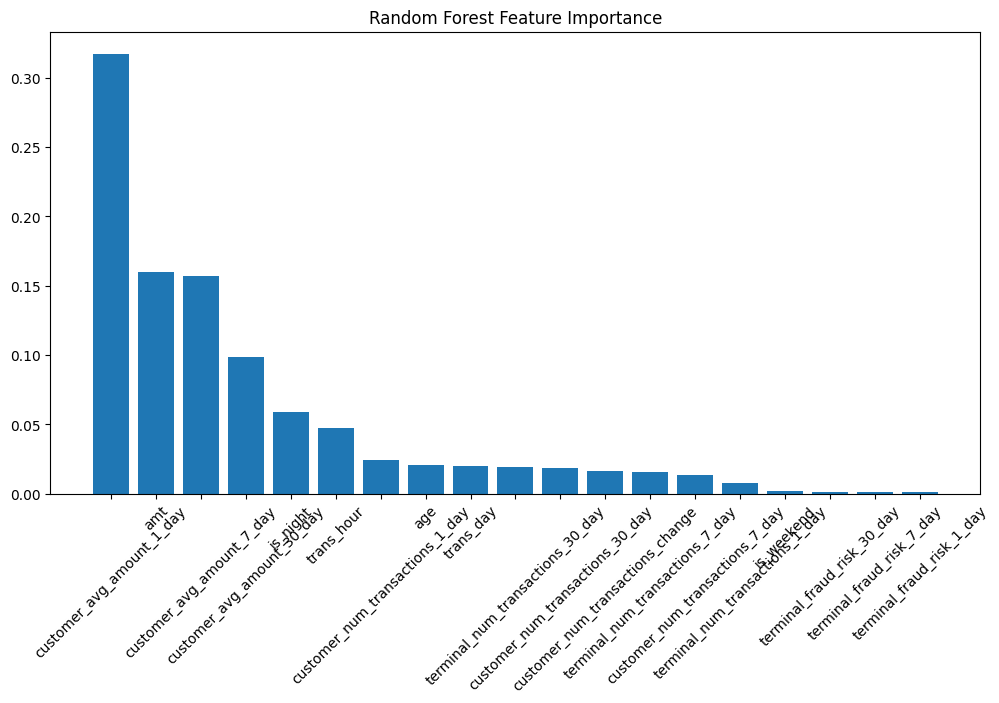

customer_avg_amount_1_day: 0.3173474895104527
amt: 0.1600348358583829
customer_avg_amount_7_day: 0.15720212369846898
customer_avg_amount_30_day: 0.09834812918088671
is_night: 0.05862598657985082
trans_hour: 0.04723683109580087
customer_num_transactions_1_day: 0.024339939327940548
age: 0.020813160422049493
trans_day: 0.019943974582272754
terminal_num_transactions_30_day: 0.01944817086927438
customer_num_transactions_30_day: 0.018451920530879698
customer_num_transactions_change: 0.016409066512060897
terminal_num_transactions_7_day: 0.015411666513117308
customer_num_transactions_7_day: 0.01363606135425524
terminal_num_transactions_1_day: 0.007452032110278347
is_weekend: 0.0016583394614244303
terminal_fraud_risk_30_day: 0.0014291961457331276
terminal_fraud_risk_7_day: 0.0011639147290052967
terminal_fraud_risk_1_day: 0.0010471615178655953


In [ ]:
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt

# Create and train the Random Forest model
rf_model = RandomForestClassifier(random_state=42, class_weight=class_weight)
rf_model.fit(train_features, train_labels.ravel())  # Use ravel() to convert column-vector y to 1d array

# Get feature importances
feature_importances = rf_model.feature_importances_

# Sort features based on importance
sorted_indices = feature_importances.argsort()[::-1]

# Plot feature importances
plt.figure(figsize=(12, 6))
plt.bar(range(train_features.shape[1]), feature_importances[sorted_indices], align="center")
plt.xticks(range(train_features.shape[1]), np.array(feature_columns)[sorted_indices], rotation=45)
plt.title("Random Forest Feature Importance")
plt.show()


# Create a list of tuples containing feature names and their importances
feature_importance_list = list(zip(feature_columns, feature_importances))

# Sort the list by importance in descending order
feature_importance_list.sort(key=lambda x: x[1], reverse=True)

# Print the feature importances
for feature, importance in feature_importance_list:
    print(f"{feature}: {importance}")

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score



# Create and train the Random Forest model
rf_model = RandomForestClassifier(random_state=42, class_weight=class_weight)
rf_model.fit(train_features, train_labels.ravel())

# Make predictions on the validation set
rf_val_predictions = rf_model.predict(val_features)

# Evaluate the model
print("Random Forest Evaluation:")
print("Validation Accuracy:", accuracy_score(val_labels, rf_val_predictions))
print("Classification Report:\n", classification_report(val_labels, rf_val_predictions))
print("Confusion Matrix:\n", confusion_matrix(val_labels, rf_val_predictions))


Random Forest Evaluation:
Validation Accuracy: 0.9916871025395901
Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00     23803
           1       1.00      0.22      0.36       256

    accuracy                           0.99     24059
   macro avg       1.00      0.61      0.68     24059
weighted avg       0.99      0.99      0.99     24059

Confusion Matrix:
 [[23803     0]
 [  200    56]]


In [ ]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid for Random Forest
rf_param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
}

# Create Random Forest model
rf_model = RandomForestClassifier(random_state=42, class_weight=class_weight)

# Create GridSearchCV instance
rf_grid_search = GridSearchCV(rf_model, rf_param_grid, cv=5, scoring='f1', n_jobs=-1)

# Fit the grid search to the data
rf_grid_search.fit(train_features, train_labels.ravel())

# Get the best parameters
best_rf_params = rf_grid_search.best_params_
print("Best Random Forest Parameters:", best_rf_params)

# Use the best parameters to create the final Random Forest model
final_rf_model = RandomForestClassifier(random_state=42, class_weight=class_weight, **best_rf_params)

# Train the model with the best parameters
final_rf_model.fit(train_features, train_labels.ravel())

# Make predictions on the validation set
rf_val_predictions_tuned = final_rf_model.predict(val_features)

# Evaluate the model on the validation set
print("Tuned Random Forest Evaluation:")
print("Validation Accuracy:", accuracy_score(val_labels, rf_val_predictions_tuned))
print("Classification Report:\n", classification_report(val_labels, rf_val_predictions_tuned))
print("Confusion Matrix:\n", confusion_matrix(val_labels, rf_val_predictions_tuned))


Best Random Forest Parameters: {'max_depth': 20, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 200}
Tuned Random Forest Evaluation:
Validation Accuracy: 0.9926846502348393
Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00     23803
           1       0.87      0.37      0.52       256

    accuracy                           0.99     24059
   macro avg       0.93      0.68      0.76     24059
weighted avg       0.99      0.99      0.99     24059

Confusion Matrix:
 [[23789    14]
 [  162    94]]


In [ ]:
pip install xgboost


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.1/297.1 MB 5.0 MB/s eta 0:00:00

[notice] A new release of pip is available: 23.0.1 -> 23.3.2
[notice] To update, run: python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [ ]:
from xgboost import XGBClassifier

# Create and train the XGBoost model
xgb_model = XGBClassifier(random_state=42, scale_pos_weight=class_weight[1.0]/class_weight[1])
xgb_model.fit(train_features, train_labels.ravel())

# Make predictions on the validation set
xgb_val_predictions = xgb_model.predict(val_features)

# Evaluate the XGBoost model
print("XGBoost Evaluation:")
print("Validation Accuracy:", accuracy_score(val_labels, xgb_val_predictions))
print("Classification Report:\n", classification_report(val_labels, xgb_val_predictions))
print("Confusion Matrix:\n", confusion_matrix(val_labels, xgb_val_predictions))


XGBoost Evaluation:
Validation Accuracy: 0.9961345026809094
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     23803
           1       0.92      0.70      0.79       256

    accuracy                           1.00     24059
   macro avg       0.96      0.85      0.90     24059
weighted avg       1.00      1.00      1.00     24059

Confusion Matrix:
 [[23787    16]
 [   77   179]]


In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV

# Define the parameter grid for XGBoost
xgb_param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
}

# Create XGBoost model
xgb_model = XGBClassifier(random_state=42, scale_pos_weight=class_weight[1.0]/class_weight[1])

# Create GridSearchCV instance
xgb_grid_search = GridSearchCV(xgb_model, xgb_param_grid, cv=5, scoring='f1', n_jobs=-1)

# Fit the grid search to the data
xgb_grid_search.fit(train_features, train_labels.ravel())

# Get the best parameters
best_xgb_params = xgb_grid_search.best_params_
print("Best XGBoost Parameters:", best_xgb_params)

# Use the best parameters to create the final XGBoost model
final_xgb_model = XGBClassifier(random_state=42, scale_pos_weight=class_weight[1.0]/class_weight[1], **best_xgb_params)

# Train the model with the best parameters
final_xgb_model.fit(train_features, train_labels.ravel())

# Make predictions on the validation set
xgb_val_predictions_tuned = final_xgb_model.predict(val_features)

# Evaluate the model on the validation set
print("Tuned XGBoost Evaluation:")
print("Validation Accuracy:", accuracy_score(val_labels, xgb_val_predictions_tuned))
print("Classification Report:\n", classification_report(val_labels, xgb_val_predictions_tuned))
print("Confusion Matrix:\n", confusion_matrix(val_labels, xgb_val_predictions_tuned))


Best XGBoost Parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 200, 'subsample': 1.0}
Tuned XGBoost Evaluation:
Validation Accuracy: 0.994056278315807
Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00     23803
           1       0.89      0.50      0.64       256

    accuracy                           0.99     24059
   macro avg       0.94      0.75      0.82     24059
weighted avg       0.99      0.99      0.99     24059

Confusion Matrix:
 [[23787    16]
 [  127   129]]


In [ ]:
pip install tensorflow keras


  Attempting uninstall: MarkupSafe
    Found existing installation: MarkupSafe 2.0.0
    Uninstalling MarkupSafe-2.0.0:
ERROR: Could not install packages due to an OSError: [Errno 30] Read-only file system: 'top_level.txt'


[notice] A new release of pip is available: 23.0.1 -> 23.3.2
[notice] To update, run: python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [ ]:
#from keras.models import Sequential
#from keras.layers import Dense

# Create a simple neural network model
#model = Sequential()
#model.add(Dense(64, input_dim=train_features.shape[1], activation='relu'))
#model.add(Dense(32, activation='relu'))
#model.add(Dense(1, activation='sigmoid'))

# Compile the model with appropriate loss function and optimizer
#model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
#model.fit(train_features, train_labels, epochs=10, batch_size=32, class_weight=class_weight)

# Evaluate the model on the validation set
#nn_val_predictions = model.predict(val_features)
# Set a threshold for classification
#threshold = 0.5

# Convert probabilities to binary predictions based on the threshold
#nn_val_predictions_binary = (nn_val_predictions > threshold).astype(int)

# Evaluate the model on the validation set
#print("Neural Network Evaluation:")
#print("Validation Accuracy:", accuracy_score(val_labels, nn_val_predictions_binary))
#print("Classification Report:\n", classification_report(val_labels, nn_val_predictions_binary))
#print("Confusion Matrix:\n", confusion_matrix(val_labels, nn_val_predictions_binary))


In [ ]:
output_bias = tf.keras.initializers.Constant(np.log([fraud_count / not_fraud_count]))

model = keras.Sequential(
    [
        keras.layers.Dense(
            500, activation="relu", input_shape=(train_features.shape[-1],)
        ),
        keras.layers.Dense(
            500, activation="relu", input_shape=(train_features.shape[-1],)
        ),
        keras.layers.Dropout(0.2),
        keras.layers.Dense(1, activation="sigmoid", bias_initializer=output_bias),
    ]
)

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss=keras.losses.BinaryCrossentropy(),
    metrics=[
        keras.metrics.Precision(name="precision"),
        keras.metrics.Recall(name="recall"),
        keras.metrics.AUC(name="auc"),
        keras.metrics.AUC(name="prc", curve="PR"),
    ],
)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 500)               10000     
                                                                 
 dense_1 (Dense)             (None, 500)               250500    
                                                                 
 dropout (Dropout)           (None, 500)               0         
                                                                 
 dense_2 (Dense)             (None, 1)                 501       
                                                                 
Total params: 261,001
Trainable params: 261,001
Non-trainable params: 0
_________________________________________________________________
2024-01-30 21:45:22.541123: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared o

In [ ]:
BATCH_SIZE = 64

early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_prc", verbose=1, patience=10, mode="max", restore_best_weights=True
)

training_history = model.fit(
    train_features,
    train_labels,
    batch_size=BATCH_SIZE,
    epochs=40,
    callbacks=[early_stopping],
    validation_data=(val_features, val_labels),
    class_weight=class_weight,
)

Epoch 1/40
564/564 [==============================] - 7s 10ms/step - loss: 0.4507 - precision: 0.0918 - recall: 0.8791 - auc: 0.9551 - prc: 0.3574 - val_loss: 0.5681 - val_precision: 0.0494 - val_recall: 0.9922 - val_auc: 0.9813 - val_prc: 0.3905
Epoch 2/40
564/564 [==============================] - 5s 9ms/step - loss: 0.2782 - precision: 0.0917 - recall: 0.9341 - auc: 0.9765 - prc: 0.3622 - val_loss: 0.2307 - val_precision: 0.1392 - val_recall: 0.9609 - val_auc: 0.9842 - val_prc: 0.4757
Epoch 3/40
564/564 [==============================] - 5s 9ms/step - loss: 0.2326 - precision: 0.1084 - recall: 0.9478 - auc: 0.9830 - prc: 0.4306 - val_loss: 0.3185 - val_precision: 0.0982 - val_recall: 0.9805 - val_auc: 0.9845 - val_prc: 0.4633
Epoch 4/40
564/564 [==============================] - 5s 9ms/step - loss: 0.2270 - precision: 0.1191 - recall: 0.9560 - auc: 0.9838 - prc: 0.4224 - val_loss: 0.1531 - val_precision: 0.1898 - val_recall: 0.9297 - val_auc: 0.9819 - val_prc: 0.4994
Epoch 5/40
564/

In [ ]:
# Evaluate the model on the validation set
nn_val_predictions = model.predict(val_features)
# Set a threshold for classification
threshold = 0.5

# Convert probabilities to binary predictions based on the threshold
nn_val_predictions_binary = (nn_val_predictions > threshold).astype(int)

# Evaluate the model on the validation set
print("Neural Network Evaluation:")
print("Validation Accuracy:", accuracy_score(val_labels, nn_val_predictions_binary))
print("Classification Report:\n", classification_report(val_labels, nn_val_predictions_binary))
print("Confusion Matrix:\n", confusion_matrix(val_labels, nn_val_predictions_binary))

752/752 [==============================] - 2s 2ms/step
Neural Network Evaluation:
Validation Accuracy: 0.9675381354170997
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.97      0.98     23803
           1       0.23      0.91      0.37       256

    accuracy                           0.97     24059
   macro avg       0.62      0.94      0.68     24059
weighted avg       0.99      0.97      0.98     24059

Confusion Matrix:
 [[23046   757]
 [   24   232]]


In [ ]:
# Train the Logistic Regression model
lr_model.fit(train_features, train_labels)
rf_model.fit(train_features, train_labels)
xgb_model.fit(train_features, train_labels)
model.fit(train_features, train_labels)

# Assign weights to each model
weights = {
    'Logistic Regression': 1.0,
    'Random Forest': 1.0,
    'XGBoost': 1.0,
    'Neural Network': 1.0
}

# Get predicted probabilities from each model
lr_probabilities = lr_model.predict_proba(val_features)[:, 1]
rf_probabilities = rf_model.predict_proba(val_features)[:, 1]
xgb_probabilities = xgb_model.predict_proba(val_features)[:, 1]
nn_probabilities = model.predict(val_features).flatten()

# Combine predictions using a weighted average
ensemble_probabilities = (
    weights['Logistic Regression'] * lr_probabilities +
    weights['Random Forest'] * rf_probabilities +
    weights['XGBoost'] * xgb_probabilities +
    weights['Neural Network'] * nn_probabilities
) / sum(weights.values())

# Convert probabilities to binary predictions based on the threshold
ensemble_predictions = (ensemble_probabilities > threshold).astype(int)

# Evaluate the ensemble on the validation set
print("Ensemble Evaluation:")
print("Validation Accuracy:", accuracy_score(val_labels, ensemble_predictions))
print("Classification Report:\n", classification_report(val_labels, ensemble_predictions))
print("Confusion Matrix:\n", confusion_matrix(val_labels, ensemble_predictions))


/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/tmp/ipykernel_67/1289004415.py:3: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

752/752 [==============================] - 1s 2ms/step
Ensemble Evaluation:
Validation Accuracy: 0.995760422295191
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     23803
           1       0.87      0.71      0.78       256

    accuracy                           1.00     24059
   macro avg       0.93      0.85      0.89     24059
weighted avg       1.00      1.00      1.00     24059

Confusion Matrix:
 [[23776    27]
 [   75   181]]


In [ ]:
# Hyperparameter-tuned Logistic Regression model
tuned_lr_model = LogisticRegression(random_state=42, class_weight=class_weight, C=best_lr_params['C'])
tuned_lr_model.fit(train_features, train_labels)

# Hyperparameter-tuned Random Forest model
tuned_rf_model = RandomForestClassifier(
    random_state=42, class_weight=class_weight, n_estimators=best_rf_params['n_estimators'], max_depth=best_rf_params['max_depth']
)
tuned_rf_model.fit(train_features, train_labels.ravel())

# Hyperparameter-tuned XGBoost model
tuned_xgb_model = XGBClassifier(
    random_state=42, scale_pos_weight=class_weight[1.0]/class_weight[1],
    n_estimators=best_xgb_params['n_estimators'], max_depth=best_xgb_params['max_depth'],
    learning_rate=best_xgb_params['learning_rate'], subsample=best_xgb_params['subsample'],
    colsample_bytree=best_xgb_params['colsample_bytree']
)
tuned_xgb_model.fit(train_features, train_labels.ravel())

# Neural Network model is already tuned, so we use the existing 'model'

# Assign weights to each tuned model
tuned_weights = {
    'Logistic Regression': 1.0,
    'Random Forest': 1.0,
    'XGBoost': 1.0,
    'Neural Network': 1.0
}

# Get predicted probabilities from each tuned model
tuned_lr_probabilities = tuned_lr_model.predict_proba(val_features)[:, 1]
tuned_rf_probabilities = tuned_rf_model.predict_proba(val_features)[:, 1]
tuned_xgb_probabilities = tuned_xgb_model.predict_proba(val_features)[:, 1]
nn_probabilities = model.predict(val_features).flatten()

# Combine predictions using a weighted average
tuned_ensemble_probabilities = (
    tuned_weights['Logistic Regression'] * tuned_lr_probabilities +
    tuned_weights['Random Forest'] * tuned_rf_probabilities +
    tuned_weights['XGBoost'] * tuned_xgb_probabilities +
    tuned_weights['Neural Network'] * nn_probabilities
) / sum(tuned_weights.values())

# Convert probabilities to binary predictions based on the threshold
tuned_ensemble_predictions = (tuned_ensemble_probabilities > threshold).astype(int)

# Evaluate the tuned ensemble on the validation set
print("Tuned Ensemble Evaluation:")
print("Validation Accuracy:", accuracy_score(val_labels, tuned_ensemble_predictions))
print("Classification Report:\n", classification_report(val_labels, tuned_ensemble_predictions))
print("Confusion Matrix:\n", confusion_matrix(val_labels, tuned_ensemble_predictions))


/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/utils/validation.py:1111: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

752/752 [==============================] - 1s 2ms/step
Tuned Ensemble Evaluation:
Validation Accuracy: 0.9945550521634315
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     23803
           1       0.83      0.61      0.71       256

    accuracy                           0.99     24059
   macro avg       0.91      0.81      0.85     24059
weighted avg       0.99      0.99      0.99     24059

Confusion Matrix:
 [[23771    32]
 [   99   157]]


In [ ]:
# Get predicted probabilities from each model on the test set
lr_test_probabilities = lr_model.predict_proba(test_features)[:, 1]
rf_test_probabilities = rf_model.predict_proba(test_features)[:, 1]
xgb_test_probabilities = xgb_model.predict_proba(test_features)[:, 1]
nn_test_probabilities = model.predict(test_features).flatten()

# Combine predictions using a weighted average
ensemble_test_probabilities = (
    weights['Logistic Regression'] * lr_test_probabilities +
    weights['Random Forest'] * rf_test_probabilities +
    weights['XGBoost'] * xgb_test_probabilities +
    weights['Neural Network'] * nn_test_probabilities
) / sum(weights.values())

# Convert probabilities to binary predictions based on the threshold
ensemble_test_predictions = (ensemble_test_probabilities > threshold).astype(int)

# Evaluate the ensemble on the test set
print("Ensemble Test Evaluation:")
print("Test Accuracy:", accuracy_score(test_labels, ensemble_test_predictions))
print("Classification Report:\n", classification_report(test_labels, ensemble_test_predictions))
print("Confusion Matrix:\n", confusion_matrix(test_labels, ensemble_test_predictions))


361/361 [==============================] - 1s 2ms/step
Ensemble Test Evaluation:
Test Accuracy: 0.9948886771203327
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     11394
           1       0.88      0.70      0.78       149

    accuracy                           0.99     11543
   macro avg       0.94      0.85      0.89     11543
weighted avg       0.99      0.99      0.99     11543

Confusion Matrix:
 [[11379    15]
 [   44   105]]


In [ ]:
# Get predicted probabilities from each tuned model on the test set
tuned_lr_test_probabilities = tuned_lr_model.predict_proba(test_features)[:, 1]
tuned_rf_test_probabilities = tuned_rf_model.predict_proba(test_features)[:, 1]
tuned_xgb_test_probabilities = tuned_xgb_model.predict_proba(test_features)[:, 1]
nn_test_probabilities = model.predict(test_features).flatten()

# Combine predictions using a weighted average
tuned_ensemble_test_probabilities = (
    tuned_weights['Logistic Regression'] * tuned_lr_test_probabilities +
    tuned_weights['Random Forest'] * tuned_rf_test_probabilities +
    tuned_weights['XGBoost'] * tuned_xgb_test_probabilities +
    tuned_weights['Neural Network'] * nn_test_probabilities
) / sum(tuned_weights.values())

# Convert probabilities to binary predictions based on the threshold
tuned_ensemble_test_predictions = (tuned_ensemble_test_probabilities > threshold).astype(int)

# Evaluate the tuned ensemble on the test set
print("Tuned Ensemble Test Evaluation:")
print("Test Accuracy:", accuracy_score(test_labels, tuned_ensemble_test_predictions))
print("Classification Report:\n", classification_report(test_labels, tuned_ensemble_test_predictions))
print("Confusion Matrix:\n", confusion_matrix(test_labels, tuned_ensemble_test_predictions))


361/361 [==============================] - 1s 2ms/step
Tuned Ensemble Test Evaluation:
Test Accuracy: 0.993415923070259
Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00     11394
           1       0.84      0.60      0.70       149

    accuracy                           0.99     11543
   macro avg       0.92      0.80      0.85     11543
weighted avg       0.99      0.99      0.99     11543

Confusion Matrix:
 [[11377    17]
 [   59    90]]


In [ ]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 535.6/535.6 kB 41.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 72.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 MB 31.2 MB/s eta 0:00:00

[notice] A new release of pip is available: 23.0.1 -> 23.3.2
[notice] To update, run: python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


/shared-libs/python3.9/py/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



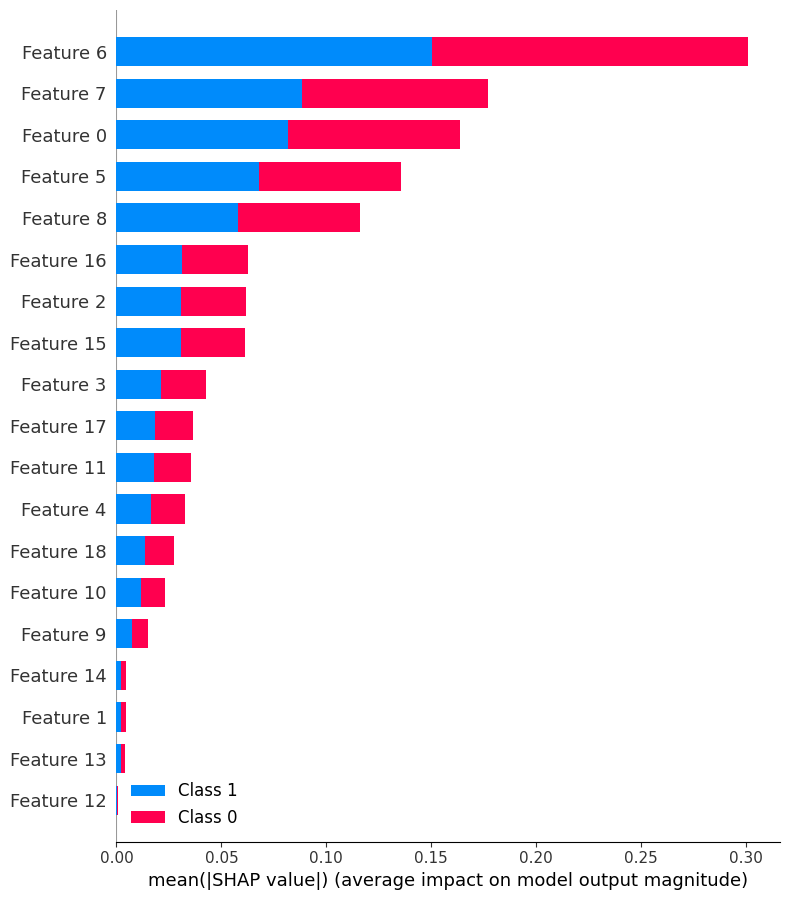

In [ ]:
import shap

# Assume rf_model is your Random Forest model
explainer = shap.TreeExplainer(rf_model)
shap_values = explainer.shap_values(val_features)

# Summary plot
shap.summary_plot(shap_values, val_features)


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=f39eb4df-104a-49bb-944d-12e2eaed598c' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>